### Práctica 3: Vorticidad y advección de vorticidad

#### Alumno: Víctor Galván Fraile

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import metpy as met
import metpy.calc as mpcalc
from metpy.cbook import get_test_data
from metpy.units import units

In [2]:
#dividir vorticidad relativa entre la planetaria para ver cual es la dominante en cada caso
path= "C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Dinamica atmosferica/Practicas/Practica 2/Datos/"
u_file= xr.open_dataset(path+'u_ERA5_2019_12h_Global_300_500_700.nc')
v_file= xr.open_dataset(path+'v_ERA5_2019_12h_Global_300_500_700.nc')
geop_file= xr.open_dataset(path+'Geopotential_ERA5_2019_12h_Global_300_500_700.nc')
geop_file

<xarray.Dataset>
Dimensions:    (longitude: 360, latitude: 181, level: 3, time: 365)
Coordinates:
  * longitude  (longitude) float32 0.0 1.0 2.0 3.0 ... 356.0 357.0 358.0 359.0
  * latitude   (latitude) float32 90.0 89.0 88.0 87.0 ... -88.0 -89.0 -90.0
  * level      (level) int32 300 500 700
  * time       (time) datetime64[ns] 2019-01-01T12:00:00 ... 2019-12-31T12:00:00
Data variables:
    z          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-12-05 17:16:16 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

## Ejercicio 1: Representar el mapa de altura geopotencial a 500 hPa y la vorticidad del viento real

In [3]:
#Primero, reducimos el grid de los datos.
lat_lims= [20,70]
lon_lims= [240,361]

u_reduced_file= u_file.isel(longitude=slice(lon_lims[0],lon_lims[1]),latitude=slice(lat_lims[0],lat_lims[1]))
u_reduced_file= u_reduced_file.sel(time='2019-01-19')

v_reduced_file= v_file.isel(longitude=slice(lon_lims[0],lon_lims[1]),latitude=slice(lat_lims[0],lat_lims[1]))
v_reduced_file= v_reduced_file.sel(time='2019-01-19')

geop_reduced_file= geop_file.isel(longitude=slice(lon_lims[0],lon_lims[1]),latitude=slice(lat_lims[0],lat_lims[1]))
geop_reduced_file= geop_reduced_file.sel(time='2019-01-19')
u_file

<xarray.Dataset>
Dimensions:    (longitude: 360, latitude: 181, level: 3, time: 365)
Coordinates:
  * longitude  (longitude) float32 0.0 1.0 2.0 3.0 ... 356.0 357.0 358.0 359.0
  * latitude   (latitude) float32 90.0 89.0 88.0 87.0 ... -88.0 -89.0 -90.0
  * level      (level) int32 300 500 700
  * time       (time) datetime64[ns] 2019-01-01T12:00:00 ... 2019-12-31T12:00:00
Data variables:
    u          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-12-05 17:26:18 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

In [4]:
#Seleccionamos los datos en el nivel que queremos: 500 [hPa]
u= u_reduced_file.sel(level=500).u.squeeze()
v= v_reduced_file.sel(level=500).v.squeeze()
geop= geop_reduced_file.sel(level=500).z.squeeze()

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


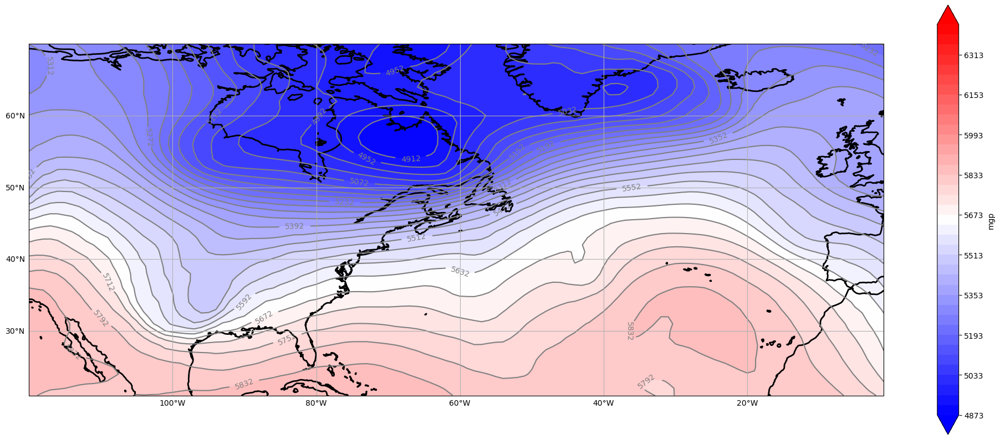

In [5]:
#Representamos primero solo el geotencial
def DibujoMapaHorizontal(lon,lat,var,levels, mapbar,unidades, titulo, figura):
    fig, ax = plt.subplots(figsize=(20, 10), ncols=1)
    ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
    im=ax.contourf(lon,lat,var,levels, cmap = mapbar, extend='both')
    ax.coastlines(linewidth = 2)
    gl=ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax,shrink=0.8, label = unidades,orientation='vertical')
    im2=ax.contour(lon,lat,var,im.levels, colors='gray')
    ax.clabel(im2, im2.levels, inline=True, fmt="%2d", fontsize=10)
    #fig.suptitle(titulo, fontsize=20, weight='bold')
    plt.tight_layout()
    fig.savefig(figura)

g= 9.80665  * units('m*s^-2')
nivel= 500
geop500_height= geop.metpy.quantify() #esto es para que meta las unidades y no las trate como un atributo
geop500= geop500_height/g #Dividimos por g para obtener altura geopotencial, teníamos m^2/s^2

lat= geop.latitude
lon= geop.longitude

cmin=np.min(geop500.metpy.dequantify())
cmax=1.1*np.max(geop500.metpy.dequantify())
levels_geop=np.arange(cmin,cmax,40)
mapbar='bwr'
titulo='hgt'+str(nivel)+' hPa'
unidades='mgp'
figura='hgt_'+str(nivel)+'.png'
DibujoMapaHorizontal(lon,lat,geop500,levels_geop,mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


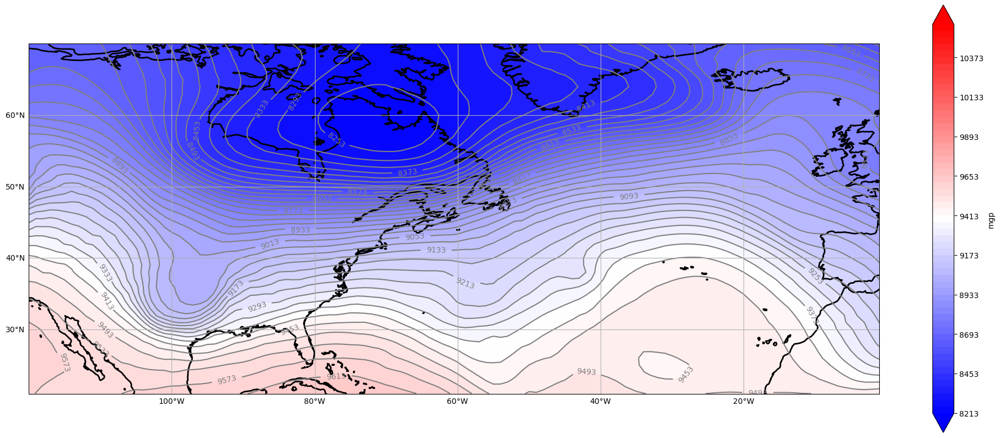

In [6]:
#Seleccionamos los datos en el nivel que queremos: 300 [hPa]
nivel= 300
u= u_reduced_file.sel(level=nivel).u.squeeze()
v= v_reduced_file.sel(level=nivel).v.squeeze()
geop300= geop_reduced_file.sel(level=nivel).z.squeeze()

g= 9.80665  * units('m*s^-2')
geop300_height= geop300.metpy.quantify() #esto es para que meta las unidades y no las trate como un atributo
geop300= geop300_height/g #Dividimos por g para obtener altura geopotencial, teníamos m^2/s^2

lat= geop.latitude
lon= geop.longitude

cmin=np.min(geop300.metpy.dequantify())
cmax=1.1*np.max(geop300.metpy.dequantify())
levels_geop300=np.arange(cmin,cmax,40)
mapbar='bwr'
titulo='hgt'+str(nivel)+' hPa'
unidades='mgp'
figura='hgt_'+str(nivel)+'.png'
DibujoMapaHorizontal(lon,lat,geop300,levels_geop300,mapbar,unidades,titulo,figura)


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


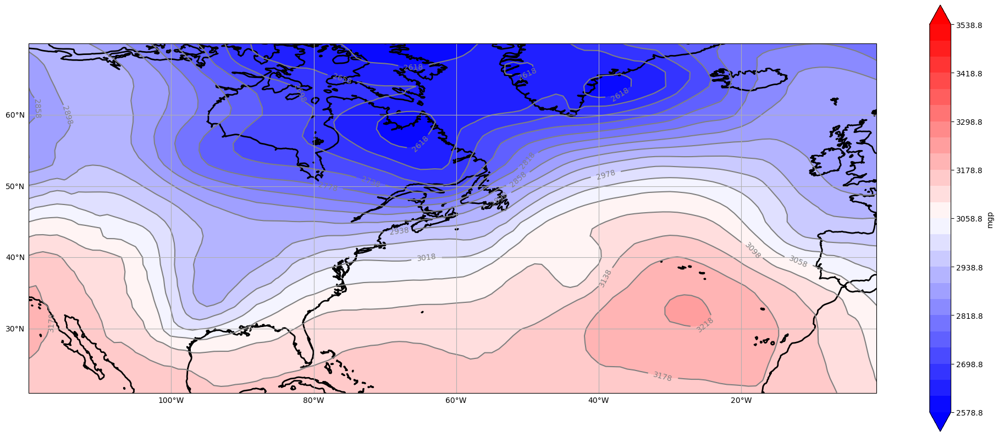

In [7]:
#Seleccionamos los datos en el nivel que queremos: 300 [hPa]
nivel= 700
u= u_reduced_file.sel(level=nivel).u.squeeze()
v= v_reduced_file.sel(level=nivel).v.squeeze()
geop700= geop_reduced_file.sel(level=nivel).z.squeeze()

g= 9.80665  * units('m*s^-2')
geop700_height= geop700.metpy.quantify() #esto es para que meta las unidades y no las trate como un atributo
geop700= geop700_height/g #Dividimos por g para obtener altura geopotencial, teníamos m^2/s^2

lat= geop.latitude
lon= geop.longitude

cmin=np.min(geop700.metpy.dequantify())
cmax=1.1*np.max(geop700.metpy.dequantify())
levels_geop700=np.arange(cmin,cmax,40)
mapbar='bwr'
titulo='hgt'+str(nivel)+' hPa'
unidades='mgp'
figura='hgt_'+str(nivel)+'.png'
DibujoMapaHorizontal(lon,lat,geop700,levels_geop700,mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


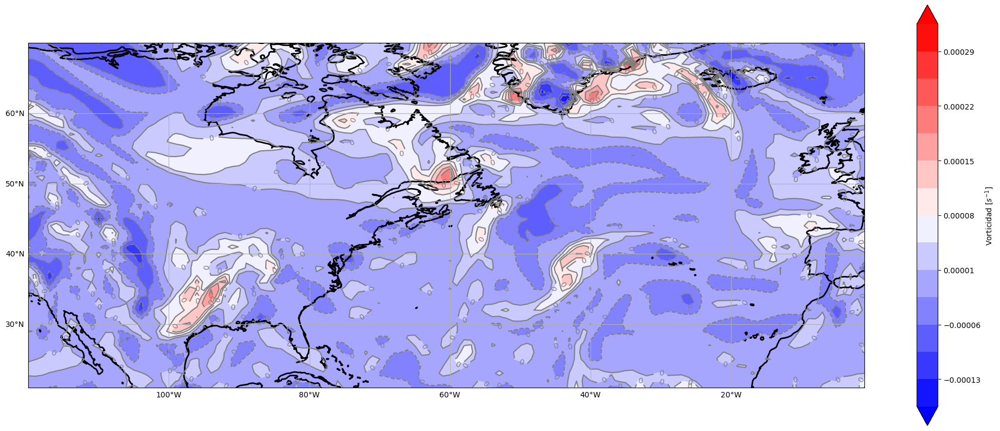

In [8]:
#calculamos ahora la vorticidad del viento real
vort=mpcalc.vorticity(u, v)
cmin=np.min(vort.metpy.dequantify())
cmax=1.1*np.max(vort.metpy.dequantify())
levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)
mapbar='bwr'
titulo='vorticidad del viento real a'+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='vorticidad_viento_real_a_'+str(nivel)+'.png'
DibujoMapaHorizontal(lon,lat,vort,levels_vort,mapbar,unidades,titulo,figura)

In [9]:
def Dibujo_withdifferentcontour(lon,lat,var1,var2,levels,levels_vort, mapbar,unidades, titulo, figura):
    fig, ax = plt.subplots(figsize=(20, 10), ncols=1)
    ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
    im=ax.contourf(lon,lat,var1,levels_vort, cmap = mapbar, extend='both')
    ax.coastlines(linewidth = 2)
    gl=ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    im2= ax.contour(lon,lat,var2,levels, colors='gray')
    ax.clabel(im2, im2.levels, inline=True, fmt='%d', fontsize=10)
    fig.colorbar(im,ax=ax,shrink=0.8, label = unidades)
    #fig.suptitle(titulo, fontsize=20, weight='bold')
    plt.tight_layout()
    fig.savefig(figura)

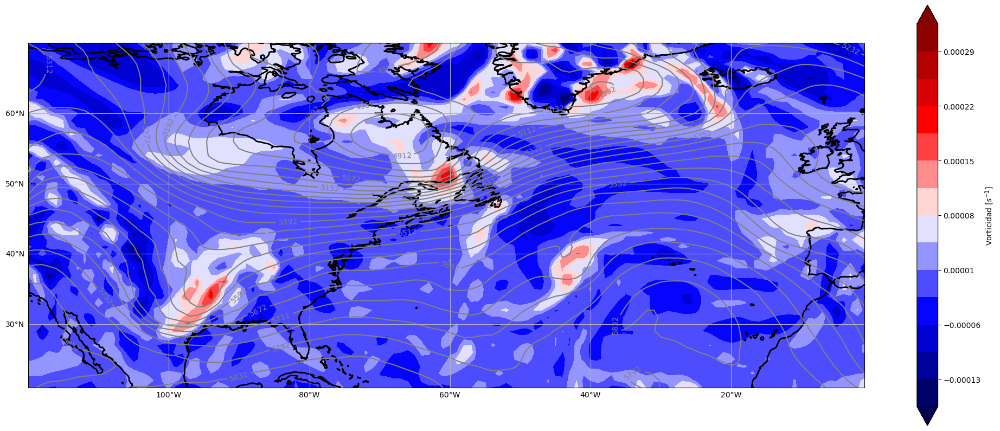

In [10]:
mapbar='seismic'
titulo='vorticidad del viento real a '+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='vorticidad_vientoreal'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,vort,geop500,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

## Ejercicio 2: Representar la altura geopotencial a 500 [hPa] junto con la vorticidad del viento geostrófico

In [11]:
#lo primero, calculamos el viento geostrófico.
#Creamos una malla de las longitudes y latitudes (como el meshgrid)
lat_grid,lon_grid= xr.broadcast(lat,lon)
f= mpcalc.coriolis_parameter(lat_grid*np.pi/180) #parámetro de coriolis (latitudes en radianes)
dx, dy = mpcalc.lat_lon_grid_deltas(lon_grid, lat_grid)
dhdy500 = mpcalc.first_derivative(geop500, delta=dy, axis=-2)
dhdx500 = mpcalc.first_derivative(geop500, delta=dx, axis=-1)
norm_factor = g / f
u_geo500=-norm_factor * dhdy500
v_geo500=norm_factor * dhdx500
vort_geos_500= mpcalc.vorticity(u_geo500, u_geo500)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


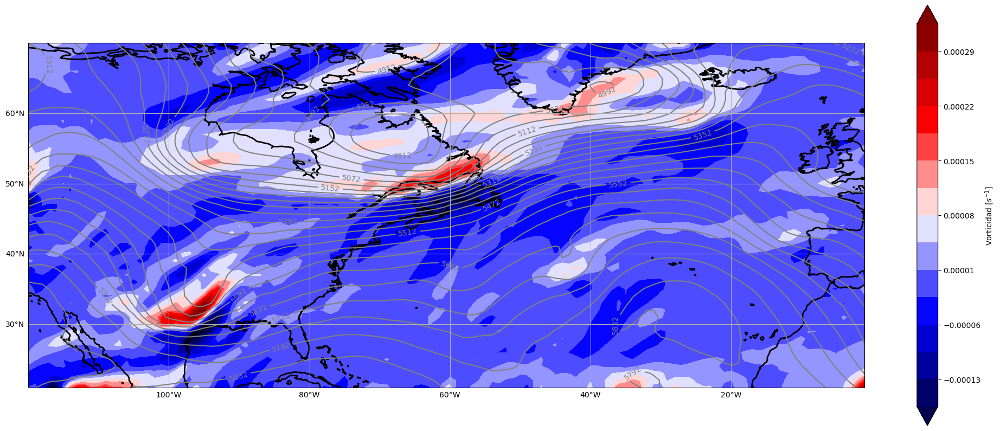

In [12]:
mapbar='seismic'
titulo='vorticidad del viento geostrofico a '+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='vorticidad_vientogeostrofico'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,vort_geos_500,geop500,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


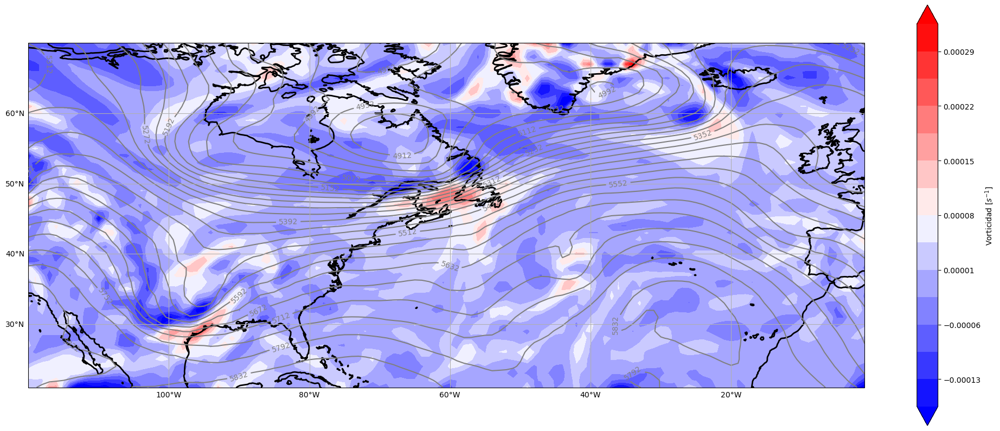

In [13]:
mapbar='bwr'
titulo='Diferencia de vorticidad entre el viento real y el viento geostrófico a'+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='anomalia_vorticidad_vientogeostrofico_y_real'+str(nivel)+'.png'
dif_vort= vort-vort_geos_500

cmin=np.min(dif_vort.metpy.dequantify())
cmax=1.1*np.max(dif_vort.metpy.dequantify())
#levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

Dibujo_withdifferentcontour(lon,lat,dif_vort,geop500,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

## Ejercicio 3: Hacer los mismos para 700 y 300 hPa

In [21]:
def DibujoMapaHorizontal2(lon,lat,var,levels, mapbar,unidades, titulo, figura):
    fig, ax = plt.subplots(figsize=(20, 10), ncols=1)
    ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
    im=ax.contourf(lon,lat,var,levels, cmap = mapbar, extend='both')
    ax.coastlines(linewidth = 1)
    gl=ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax,shrink=0.8, label = unidades,orientation='vertical')
    #im2=ax.contour(lon,lat,var,im.levels, colors='gray')
    #ax.clabel(im2, im2.levels, inline=True, fmt="%.1f", fontsize=10)
    #fig.suptitle(titulo, fontsize=20, weight='bold')
    plt.tight_layout()
    fig.savefig(figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xl

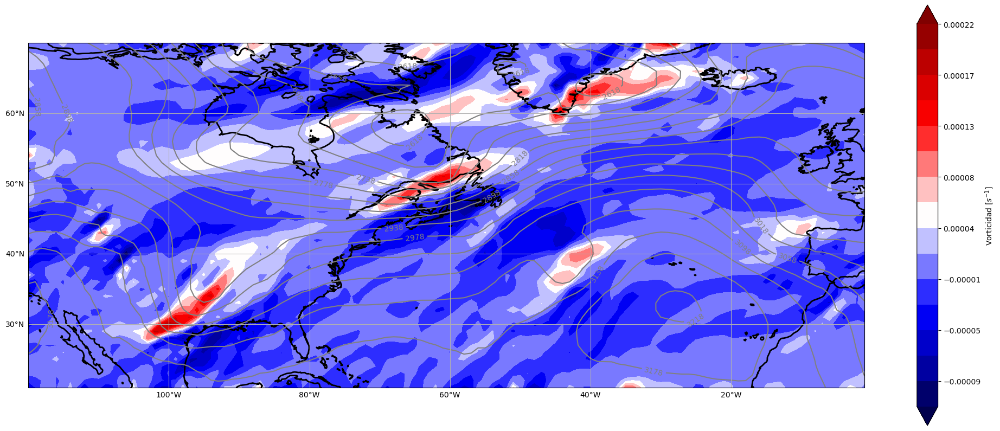

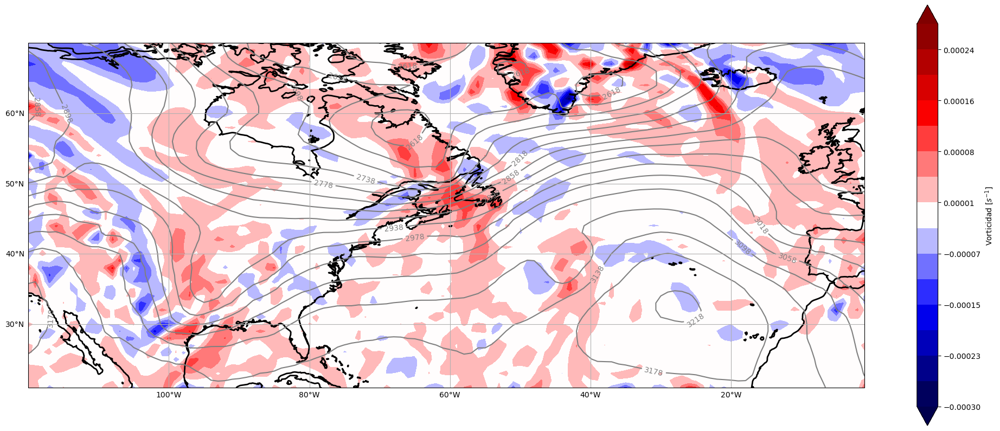

In [28]:
#Seleccionamos los datos en el nivel que queremos: 700 [hPa]
u= u_reduced_file.sel(level=700).u.squeeze()
v= v_reduced_file.sel(level=700).v.squeeze()
geop700= geop_reduced_file.sel(level=700).z.squeeze()

g= 9.80665  * units('m*s^-2')
nivel= 700
geop700_height= geop700.metpy.quantify() #esto es para que meta las unidades y no las trate como un atributo
geop700= geop700_height/g #Dividimos por g para obtener altura geopotencial, teníamos m^2/s^2

cmin=np.min(geop700.metpy.dequantify())
cmax=1.1*np.max(geop700.metpy.dequantify())
levels_geop= np.arange(cmin,cmax,40)

#calculamos el viento geostrófico.
#Creamos una malla de las longitudes y latitudes (como el meshgrid)
lat_grid,lon_grid= xr.broadcast(lat,lon)
f= mpcalc.coriolis_parameter(lat_grid*np.pi/180) #parámetro de coriolis (latitudes en radianes)
dx, dy = mpcalc.lat_lon_grid_deltas(lon_grid, lat_grid)
dhdy700 = mpcalc.first_derivative(geop700, delta=dy, axis=-2)
dhdx700 = mpcalc.first_derivative(geop700, delta=dx, axis=-1)
norm_factor = g / f
u_geo700=-norm_factor * dhdy700
v_geo700=norm_factor * dhdx700
vort_geos= mpcalc.vorticity(u_geo700, u_geo700)

cmin=np.min(vort_geos.metpy.dequantify())
cmax=1.1*np.max(vort_geos.metpy.dequantify())
levels_vort=np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

mapbar='seismic'
titulo='Vorticidad del viento geostrófico a '+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='vorticidad_viento_geostrofico'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,vort_geos,geop700,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

#calculamos ahora la vorticidad del viento real
vort=mpcalc.vorticity(u, v)
dif_vort= vort-vort_geos
cmin=np.min(dif_vort.metpy.dequantify())
cmax=1.1*np.max(dif_vort.metpy.dequantify())
levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

mapbar='seismic'
titulo='Diferencia de vorticidad entre el viento real y el viento geostrófico a'+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='anomalia_vorticidad_vientogeostrofico_y_real'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,dif_vort,geop700,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\metpy\xarray.py:1473: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


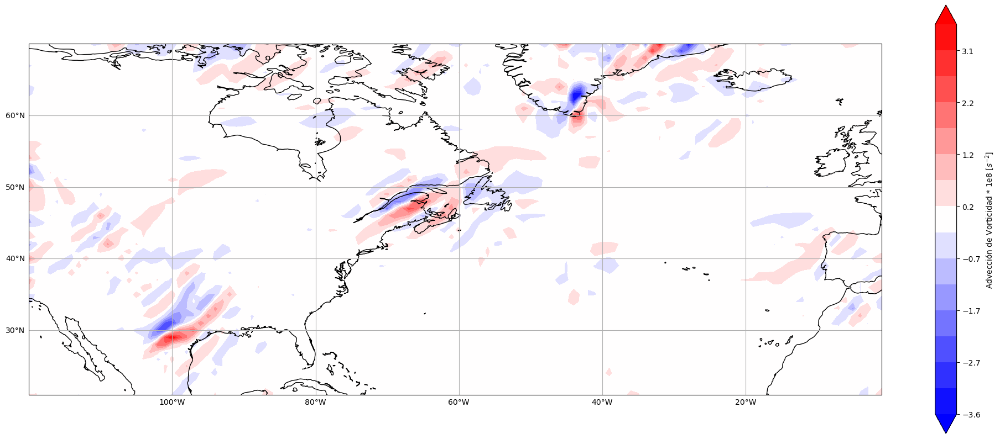

In [29]:
#calculamos la advección de vorticidad relativa por parte del viento térmico
factor= 1e8
adveccion_vort_relativa_700= mpcalc.advection(vort_geos,u,v)*factor #multpilicamos por este factor para poder analizar mejor los resultados

maximo= np.max(np.abs(adveccion_vort_relativa_700.metpy.dequantify()))
cmin=np.min(adveccion_vort_relativa_700.metpy.dequantify())
cmax=1.1*np.max(adveccion_vort_relativa_700.metpy.dequantify())
levels_advec= np.round(np.arange(-maximo,+1.1*maximo,(maximo-(-maximo))/15), decimals=1)

mapbar='bwr'
titulo='Advección de vorticidad relativa por el viento geostrófico'
unidades='Advección de Vorticidad * 1e8 [$s^{-2}$]'
figura='adveccion_de_vorticidad_relativa_vientogesotrofico_700.png'

DibujoMapaHorizontal2(lon,lat,adveccion_vort_relativa_700,levels_advec,mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xl

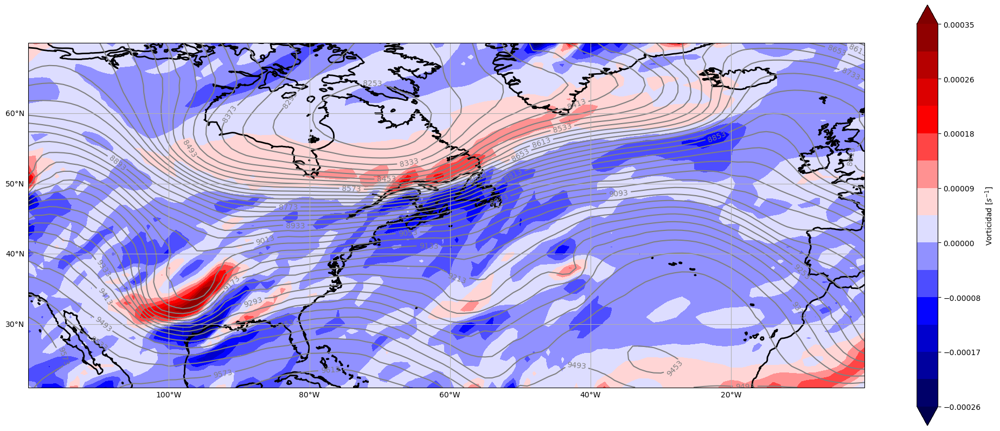

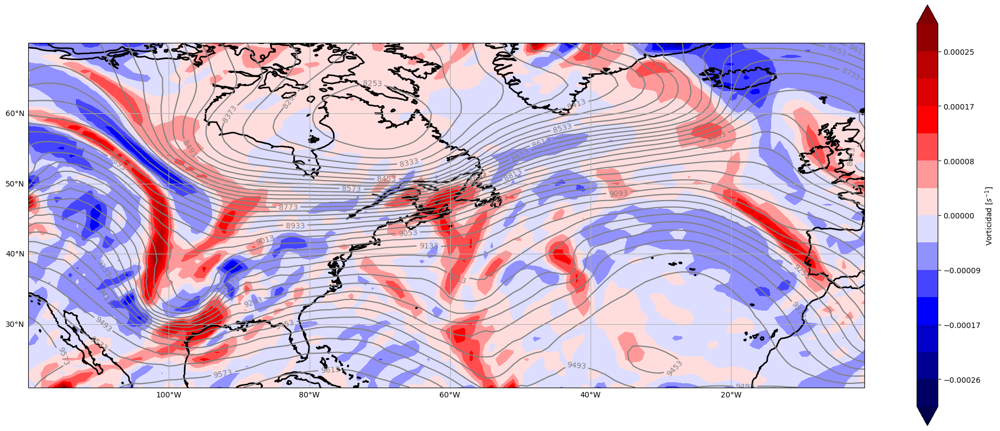

In [30]:
#Seleccionamos los datos en el nivel que queremos: 700 [hPa]
u= u_reduced_file.sel(level=300).u.squeeze()
v= v_reduced_file.sel(level=300).v.squeeze()
geop300= geop_reduced_file.sel(level=300).z.squeeze()

g= 9.80665  * units('m*s^-2')
nivel= 300
geop300_height= geop300.metpy.quantify() #esto es para que meta las unidades y no las trate como un atributo
geop300= geop300_height/g #Dividimos por g para obtener altura geopotencial, teníamos m^2/s^2

cmin=np.min(geop300.metpy.dequantify())
cmax=1.1*np.max(geop300.metpy.dequantify())
levels_geop=np.arange(cmin,cmax,40)

#calculamos el viento geostrófico.
#Creamos una malla de las longitudes y latitudes (como el meshgrid)
lat_grid,lon_grid= xr.broadcast(lat,lon)
f= mpcalc.coriolis_parameter(lat_grid*np.pi/180) #parámetro de coriolis (latitudes en radianes)
dx, dy = mpcalc.lat_lon_grid_deltas(lon_grid, lat_grid)
dhdy300 = mpcalc.first_derivative(geop300, delta=dy, axis=-2)
dhdx300 = mpcalc.first_derivative(geop300, delta=dx, axis=-1)
norm_factor = g / f
u_geo300=-norm_factor * dhdy300
v_geo300=norm_factor * dhdx300
vort_geos= mpcalc.vorticity(u_geo300, u_geo300)

cmin=np.min(vort_geos.metpy.dequantify())
cmax=1.1*np.max(vort_geos.metpy.dequantify())
levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

mapbar='seismic'
titulo='Vorticidad del viento geostrófico a '+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='vorticidad_viento_geostrofico'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,vort_geos,geop300,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

#calculamos ahora la vorticidad del viento real
vort=mpcalc.vorticity(u, v)
dif_vort= vort-vort_geos
cmin=np.min(dif_vort.metpy.dequantify())
cmax=1.1*np.max(dif_vort.metpy.dequantify())
levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

mapbar='seismic'
titulo='Diferencia de vorticidad entre el viento real y el viento geostrófico a '+str(nivel)+' hPa'
unidades='Vorticidad [$s^{-1}$]'
figura='anomalia_vorticidad_vientogeostrofico_y_real'+str(nivel)+'.png'

Dibujo_withdifferentcontour(lon,lat,dif_vort,geop300,levels_geop,levels_vort, mapbar,unidades, titulo, figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\metpy\xarray.py:1473: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


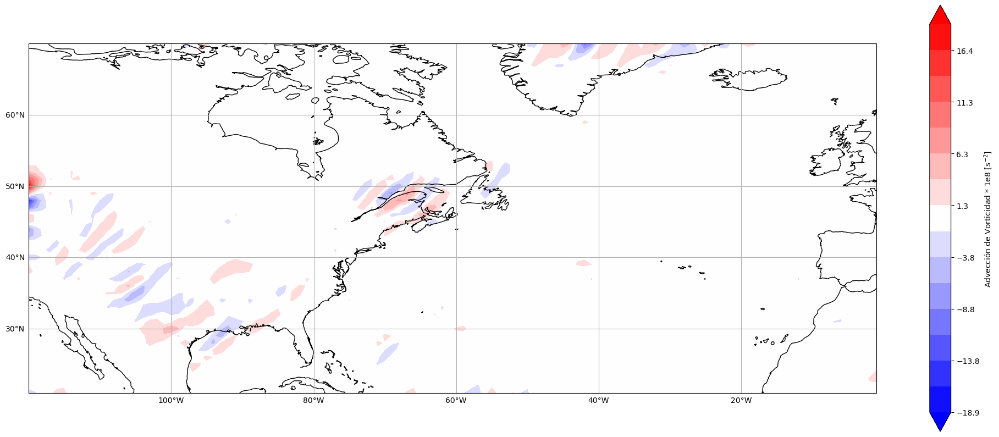

In [31]:
#calculamos la advección de vorticidad relativa por parte del viento geostrofico
factor= 1e8
adveccion_vort_relativa_300= mpcalc.advection(vort_geos,u,v)*factor #multpilicamos por este factor para poder analizar mejor los resultados

maximo= np.max(np.abs(adveccion_vort_relativa_300.metpy.dequantify()))
cmin=np.min(adveccion_vort_relativa_300.metpy.dequantify())
cmax=1.1*np.max(adveccion_vort_relativa_300.metpy.dequantify())
levels_advec= np.round(np.arange(-maximo,+1.1*maximo,(maximo-(-maximo))/15), decimals=1)

mapbar='bwr'
titulo='Advección de vorticidad relativa por el viento geostrófico'
unidades='Advección de Vorticidad * 1e8 [$s^{-2}$]'
figura='adveccion_de_vorticidad_relativa_vientogesotrofico_300.png'

DibujoMapaHorizontal2(lon,lat,adveccion_vort_relativa_300,levels_advec,mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


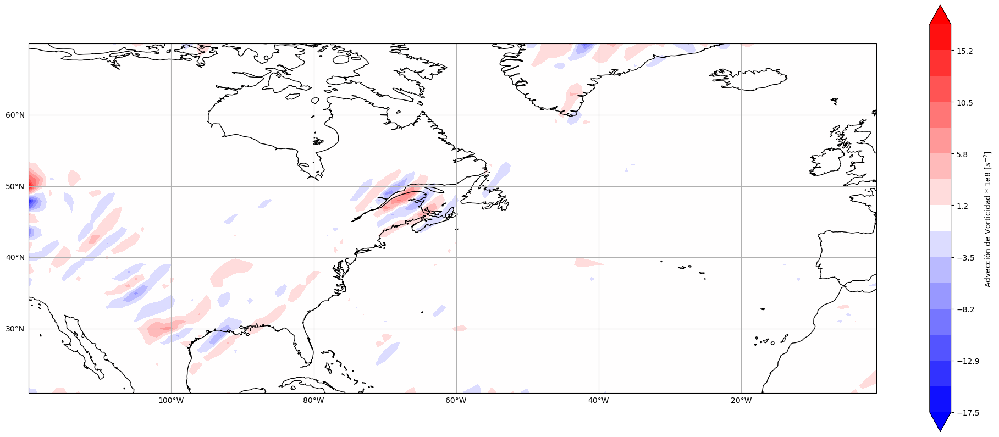

In [38]:
mapbar='bwr'
titulo='Advección de vorticidad relativa por el viento geostrófico'
unidades='Advección de Vorticidad * 1e8 [$s^{-2}$]'
figura='diferencia_de_adveccion_de_vorticidad_relativa_vientogesotrofico_300-700.png'

diferencia= adveccion_vort_relativa_300-adveccion_vort_relativa_700
maximo= np.max(np.abs(diferencia.metpy.dequantify()))
cmin=np.min(diferencia.metpy.dequantify())
cmax=1.1*np.max(diferencia.metpy.dequantify())
levels_advec= np.round(np.arange(-maximo,+1.1*maximo,(maximo-(-maximo))/15), decimals=1)

DibujoMapaHorizontal2(lon,lat,diferencia,levels_advec,mapbar,unidades,titulo,figura)

## Ejercicio 4: Advección de vorticidad por el viento térmico

In [16]:
def DibujoWind(lon,lat,var,levels,componente_u,componente_v, mapbar,unidades, titulo, figura):
    fig, ax = plt.subplots(figsize=(20, 10), ncols=1)
    ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
    wind_module= np.sqrt(componente_u**2+componente_v**2)
    #im=ax.contour(lon,lat,wind_module, colors='gray')
    im=ax.contourf(lon,lat,var,levels, cmap = mapbar, extend='both')
    ax.coastlines(linewidth = 1)
    gl=ax.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax,shrink=0.8, label = unidades)
    #im2=ax.contour(lon,lat,var,levels, colors='gray')
    #ax.clabel(im2, im2.levels, inline=True, fontsize=10)
    im3= ax.quiver(lon,lat,componente_u, componente_v)
    wind_arrow= 25
    ax.quiverkey(im3,0.5,1.05,wind_arrow,label='Wind arrow for '+str(wind_arrow)+' [m/s]', labelpos='S')
    #fig.suptitle(titulo, fontsize=20, weight='bold')
    plt.tight_layout()
    fig.savefig(figura)

In [17]:
#calculamos el viento térmico entre 700 y 300 hpa, recordando que es básicamente la cizalladura del viento geostrófico entre ambas capas
u_termico= u_geo300-u_geo700
v_termico= v_geo300-v_geo700

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


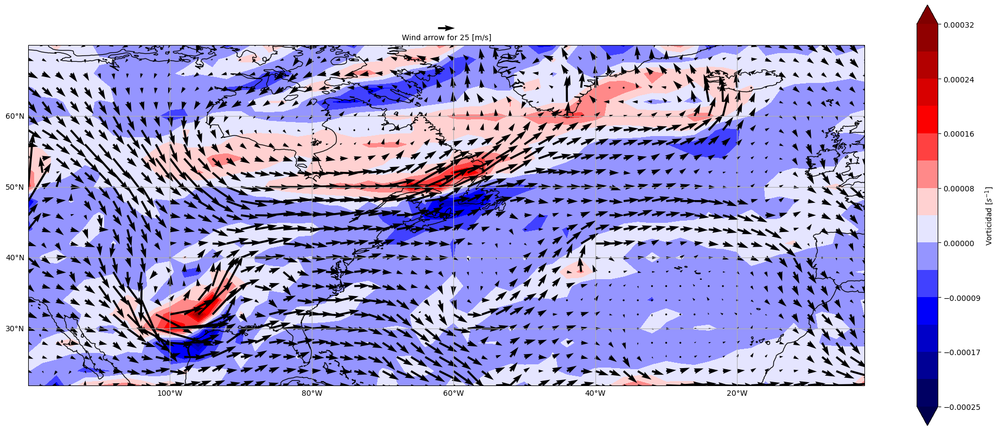

In [18]:
cmin=np.min(vort_geos_500.metpy.dequantify())
cmax=1.1*np.max(vort_geos_500.metpy.dequantify())
levels_vort= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=5)

mapbar='seismic'
titulo='Viento térmico entre 700 y 300 hPa y vorticidad'
unidades='Vorticidad [$s^{-1}$]'
figura='viento termico entre 700 y 300 hPa y vorticidad.png'

DibujoWind(lon[::2],lat[::2],vort_geos_500[::2,::2],levels_vort,u_termico[::2,::2],v_termico[::2,::2],mapbar,unidades,titulo,figura)


C:\Anaconda\envs\analisisdatosucm\lib\site-packages\metpy\xarray.py:1473: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


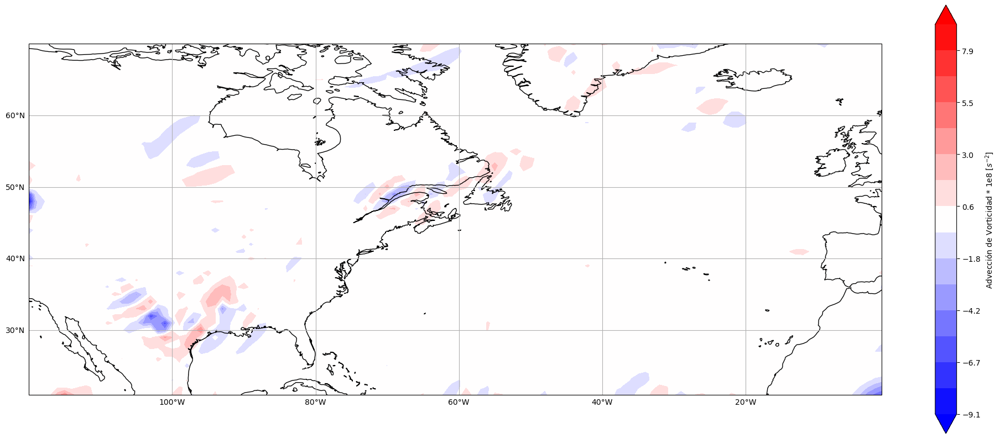

In [20]:
#calculamos la advección de vorticidad relativa por parte del viento térmico
factor= 1e8
adveccion_vort_relativa= mpcalc.advection(vort_geos_500,u_termico,v_termico)*factor #multpilicamos por este factor para poder analizar mejor los resultados

maximo= np.max(np.abs(adveccion_vort_relativa.metpy.dequantify()))
cmin=np.min(adveccion_vort_relativa.metpy.dequantify())
cmax=1.1*np.max(adveccion_vort_relativa.metpy.dequantify())
levels_advec= np.round(np.arange(-maximo,+1.1*maximo,(maximo-(-maximo))/15), decimals=1)

mapbar='bwr'
titulo='Advección de vorticidad relativa por el viento térmico'
unidades='Advección de Vorticidad * 1e8 [$s^{-2}$]'
figura='adveccion_de_vorticidad_relativa_vientotermico.png'

DibujoMapaHorizontal2(lon,lat,adveccion_vort_relativa,levels_advec,mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


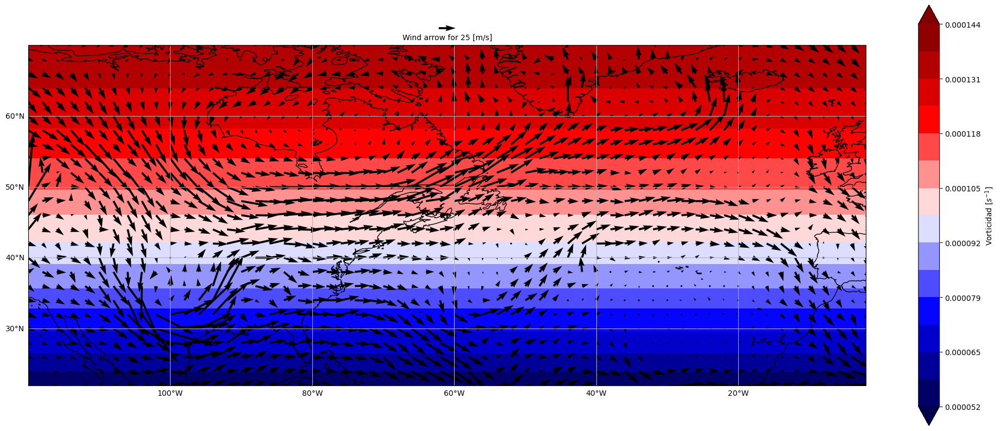

In [24]:
# por último, calculamos la advección de vorticidad planetaria en 500 hPa por el viento térmico
cmin=np.min(f.metpy.dequantify())
cmax=1.1*np.max(f.metpy.dequantify())
levels_f= np.round(np.arange(cmin,cmax,(cmax-cmin)/15), decimals=6)

mapbar='seismic'
titulo='Viento térmico entre 700 y 300 hPa y vorticidad planetaria'
unidades='Vorticidad [$s^{-1}$]'
figura='viento termico entre 700 y 300 hPa y vorticidad planetaria.png'

DibujoWind(lon[::2],lat[::2],f[::2,::2],levels_f,u_termico[::2,::2],v_termico[::2,::2],mapbar,unidades,titulo,figura)

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\metpy\xarray.py:1473: UserWarning: Vertical dimension number not found. Defaulting to (..., Z, Y, X) order.
  warnings.warn(
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


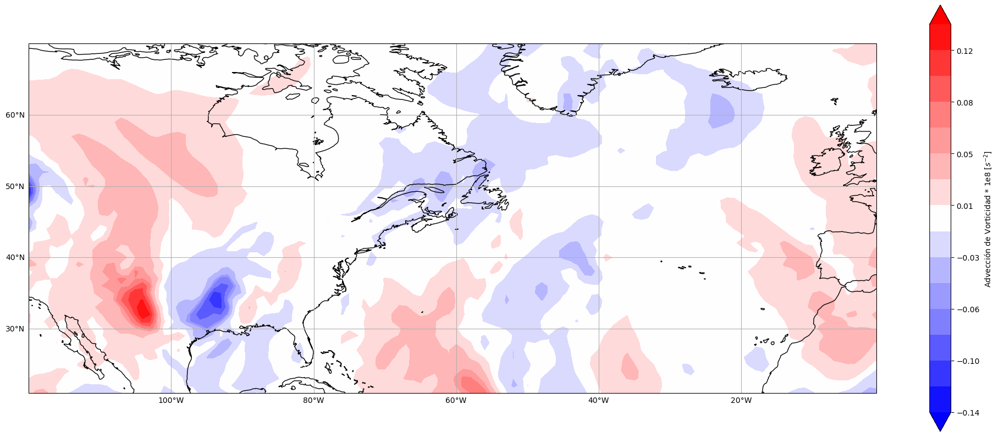

In [25]:
#calculamos la advección de vorticidad planetarua por parte del viento térmico
factor= 1e8
adveccion_vort_planetaria= mpcalc.advection(f,u_termico,v_termico)*factor #multpilicamos por este factor para poder analizar mejor los resultados

maximo= np.max(np.abs(adveccion_vort_planetaria.metpy.dequantify()))
levels_advec= np.round(np.arange(-maximo,+1.1*maximo,(maximo-(-maximo))/15), decimals=2)

mapbar='bwr'
titulo='Advección de vorticidad planetaria por el viento térmico'
unidades='Advección de Vorticidad * 1e8 [$s^{-2}$]'
figura='adveccion_de_vorticidad_planetaria_vientotermico.png'

DibujoMapaHorizontal2(lon,lat,adveccion_vort_planetaria,levels_advec,mapbar,unidades,titulo,figura)